In [1]:
import sys
import os
from pathlib import Path
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime
import torch
from io import BytesIO
from zipfile import ZipFile
from urllib.request import urlopen
from tqdm.auto import tqdm
import numpy as np

import shutil


In [2]:
RAW_DATA_DIR = "raw/geolife"
PROCESSED_DATA_DIR = "processed"
LABLES_TO_EXTRACT = ['run', 'walk', 'bus', 'car', 'taxi', 'subway', 'train', 'bike', 'motorcycle']
raw_data = Path(RAW_DATA_DIR) / "Geolife Trajectories 1.3" / "Data"

Download dataset if not exists

In [3]:
if not os.path.exists(RAW_DATA_DIR):
    with tqdm(total=1) as pbar:
        os.makedirs(RAW_DATA_DIR)

        url = "https://download.microsoft.com/download/F/4/8/F4894AA5-FDBC-481E-9285-D5F8C4C4F039/Geolife%20Trajectories%201.3.zip"
        with urlopen(url) as zipresp:
            with ZipFile(BytesIO(zipresp.read())) as zfile:
                zfile.extractall(
                    RAW_DATA_DIR
                )
        pbar.update()
else :
    print("Data already downloaded")

  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
source_dir = Path(RAW_DATA_DIR) / "Geolife Trajectories 1.3" / "Data"
destination_dir = Path(RAW_DATA_DIR) / "Geolife Trajectories 1.3" / "RawData"

if not destination_dir.exists():
    shutil.copytree(source_dir, destination_dir)
    print(f"Data copied to {destination_dir}")
else:
    print(f"Destination directory {destination_dir} already exists")

Data copied to raw\geolife\Geolife Trajectories 1.3\RawData


In [5]:
if os.path.exists(RAW_DATA_DIR):
    raw_data = Path(RAW_DATA_DIR) / "Geolife Trajectories 1.3" / "Data"

    for participant_folder in raw_data.iterdir():
        if participant_folder.is_dir():
            contents = list(participant_folder.iterdir())
            if len(contents) != 2 or not any(item.is_file() for item in contents) or not any(item.is_dir() for item in contents):
                print(f"Removing folder: {participant_folder}")
                shutil.rmtree(participant_folder)

Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\000
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\001
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\002
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\003
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\004
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\005
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\006
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\007
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\008
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\009
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\011
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\012
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\013
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\014
Removing folder: raw\geolife\Geolife Trajectories 1.3\Data\015
Removing folder: raw\geolife\Geolife Trajectories 1.3\D

In [6]:
class_data = Path(RAW_DATA_DIR) / "Geolife Trajectories 1.3" / "ClassData"
if os.path.exists(RAW_DATA_DIR) and not os.path.exists(class_data):
    raw_data = Path(RAW_DATA_DIR) / "Geolife Trajectories 1.3" / "Data"

    participants = sorted(raw_data.iterdir())
    for idx, participant_folder in enumerate(participants, start=1):
        new_name = raw_data / f"{idx}"
        participant_folder.rename(new_name)

    raw_data.rename(Path(RAW_DATA_DIR) / "Geolife Trajectories 1.3" / "ClassData")

In [6]:
# Multi threaded version
import threading

import concurrent.futures

lock = threading.Lock()

def process_trajectory_file(file_path):
    df = pd.read_csv(file_path, skiprows=6, header=None, usecols=[0, 1, 5, 6], names=['latitude', 'longitude', 'date', 'time'])
    df['date_time'] = pd.to_datetime(df['date'] + ' ' + df['time'])
    df.drop(columns=['date', 'time'], inplace=True)
    df['timestamp'] = df['date_time'].astype(np.int64) / 10**9
    return df

PROCESSED_DATA = {}

def process_participant_folder(participant_folder):
    print(f"Processing folder: {participant_folder.name}")
    
    if participant_folder.is_dir():
        labels_file = participant_folder / "labels.txt"
        trajectory_folder = participant_folder / "Trajectory"
        
        if labels_file.exists() and trajectory_folder.exists():
            print(f"Processing {participant_folder.name} labels")
            # Read the labels file and create a dataframe
            labels_df = pd.read_csv(labels_file, sep='\t')

            labels_df['Start Time'] = pd.to_datetime(labels_df['Start Time'])
            labels_df['End Time'] = pd.to_datetime(labels_df['End Time'])
            labels_df['Transportation Mode'] = labels_df['Transportation Mode'].astype(str)

            labels_df = labels_df[labels_df['Transportation Mode'].isin(LABLES_TO_EXTRACT)].reset_index(drop=True)

            # Get the trajectory files
            trajectory_files = sorted(list(trajectory_folder.glob("*.plt")))
            trajectory_dataframes = [process_trajectory_file(file) for file in trajectory_files]

            print(f"Checking {participant_folder.name} labels for null values")
            # Check for null values and empty dataframes
            for i, df in enumerate(trajectory_dataframes):
                if df.isnull().values.any():
                    print(f"DataFrame at index {i} contains null values.")
                if df.empty:
                    print(f"DataFrame at index {i} is empty.")

            print(f"Extracting {participant_folder.name} data")
            # Extract the dataframes for each row in the labels dataframe
            extracted_dataframes = {}

            for index, row in labels_df.iterrows():
                start_time = row['Start Time']
                end_time = row['End Time']
                label = row['Transportation Mode']

                filtered_dfs = []
                for df in trajectory_dataframes:
                    filtered_df = df[(df['date_time'] >= start_time) & (df['date_time'] <= end_time)]
                    if not filtered_df.empty:
                        filtered_dfs.append(filtered_df)

                if filtered_dfs:
                    combined_df = pd.concat(filtered_dfs)
                    extracted_dataframes[f"{index}_{label}"] = combined_df

            print(f"Checking {participant_folder.name} data for null values")
            # Check for null values and empty dataframes
            for i, df in extracted_dataframes.items():
                if df.isnull().values.any():
                    print(f"DataFrame at index {i} contains null values.")
                if df.empty:
                    print(f"DataFrame at index {i} is empty.")
            
            with lock:
                print(f"Adding {participant_folder.name} data to final result")
                PROCESSED_DATA[participant_folder.name] = extracted_dataframes
                print(f"Done adding {participant_folder.name} data to final result")

# Use ThreadPoolExecutor to process participant folders in parallel
with concurrent.futures.ThreadPoolExecutor(max_workers=16) as executor:
    executor.map(process_participant_folder, raw_data.iterdir())

Processing folder: 1
Processing 1 labels
Processing folder: 10
Processing folder: 11
Processing folder: 12
Processing 10 labels
Processing 11 labels
Processing folder: 13
Processing 12 labels
Processing folder: 14
Processing 13 labels
Processing folder: 15
Processing 14 labels
Processing folder: 16
Processing 15 labels
Processing 16 labels
Processing folder: 17
Processing 17 labels
Processing folder: 18
Processing 18 labels
Processing folder: 19
Processing 19 labels
Processing folder: 2
Processing 2 labels
Processing folder: 20
Processing folder: 21
Processing 20 labels
Processing 21 labels
Processing folder: 22
Processing 22 labels
Processing folder: 23
Processing 23 labels
Checking 15 labels for null values
Checking 20 labels for null values
Extracting 20 data
Extracting 15 data
Checking 18 labels for null values
Extracting 18 data
Checking 20 data for null values
Adding 20 data to final result
Done adding 20 data to final result
Processing folder: 24
Processing 24 labels
Checking 18

C:\Users\raduc\AppData\Local\Temp\ipykernel_20828\3336126734.py:10: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['date_time'] = pd.to_datetime(df['date'] + ' ' + df['time'])


Checking 37 labels for null values
Extracting 37 data
Checking 42 labels for null values
Extracting 42 data
Checking 42 data for null values
Adding 42 data to final result
Done adding 42 data to final result
Processing folder: 43
Processing 43 labels
Checking 43 labels for null values
Extracting 43 data
Checking 4 labels for null values
Extracting 4 data
Checking 19 data for null values
Adding 19 data to final result
Done adding 19 data to final result
Processing folder: 44
Processing 44 labels
Checking 10 labels for null values
Extracting 10 data
Checking 30 data for null values
Adding 30 data to final result
Done adding 30 data to final result
Processing folder: 45
Processing 45 labels
Checking 43 data for null values
Adding 43 data to final result
Done adding 43 data to final result
Processing folder: 46
Processing 46 labels
Checking 45 labels for null values
Extracting 45 data
Checking 45 data for null values
Adding 45 data to final result
Done adding 45 data to final result
Proces

In [7]:
participants_with_no_data = [participant for participant, dataframes in PROCESSED_DATA.items() if not dataframes]
print("Participants with no data:", participants_with_no_data)

# Remove participants with no data from PROCESSED_DATA
PROCESSED_DATA = {participant: dataframes for participant, dataframes in PROCESSED_DATA.items() if dataframes}

Participants with no data: ['27', '47', '49', '50', '8']


In [8]:
for participant, dataframes in PROCESSED_DATA.items():
    for label, df in dataframes.items():
        dataframes[label] = df.sort_values(by='date_time').reset_index(drop=True)

In [9]:

tmp_processed_data = {}

for new_id, (participant, dataframes) in enumerate(PROCESSED_DATA.items(), start=1):
    tmp_processed_data[new_id] = dataframes

PROCESSED_DATA = tmp_processed_data


In [10]:
import pickle

if not os.path.exists(PROCESSED_DATA_DIR):
    os.makedirs(PROCESSED_DATA_DIR)
    
with open(os.path.join(PROCESSED_DATA_DIR, 'geolife_processed_data.pkl'), 'wb') as f:
    pickle.dump(PROCESSED_DATA, f)

In [11]:
# Load data from the processed data file
import pickle

LOADED_DATA = {}

# Load the processed data
with open(os.path.join(PROCESSED_DATA_DIR, 'geolife_processed_data.pkl'), 'rb') as f:
    LOADED_DATA = pickle.load(f)

# Test the dataframes
for participant, dataframes in LOADED_DATA.items():
    for label, df in dataframes.items():
        print(f"Participant: {participant}, Label: {label}")
        print(df.info())
        print(df.head())
        break  # Remove this break to print all dataframes
    break  # Remove this break to print all participants

Participant: 1, Label: 0_bus
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72 entries, 0 to 71
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   latitude   72 non-null     float64       
 1   longitude  72 non-null     float64       
 2   date_time  72 non-null     datetime64[ns]
 3   timestamp  72 non-null     float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.4 KB
None
    latitude   longitude           date_time     timestamp
0  39.975133  116.329467 2007-06-27 09:49:22  1.182938e+09
1  39.975250  116.329067 2007-06-27 09:50:07  1.182938e+09
2  39.975267  116.329283 2007-06-27 09:50:11  1.182938e+09
3  39.975250  116.329417 2007-06-27 09:50:33  1.182938e+09
4  39.975283  116.330033 2007-06-27 09:51:58  1.182938e+09


In [ ]:
import folium

participant_dataframes = LOADED_DATA[60]

# Create a map centered around Beijing
beijing_map = folium.Map(location=[39.9042, 116.4074], zoom_start=12)

# Plot each route for participant
for label, df in participant_dataframes.items():
    route = folium.PolyLine(
        locations=df[['latitude', 'longitude']].values,
        color='blue',
        weight=2.5,
        opacity=1
    )
    route.add_to(beijing_map)

# Display the map
beijing_map

In [13]:
print(len(LOADED_DATA))

64


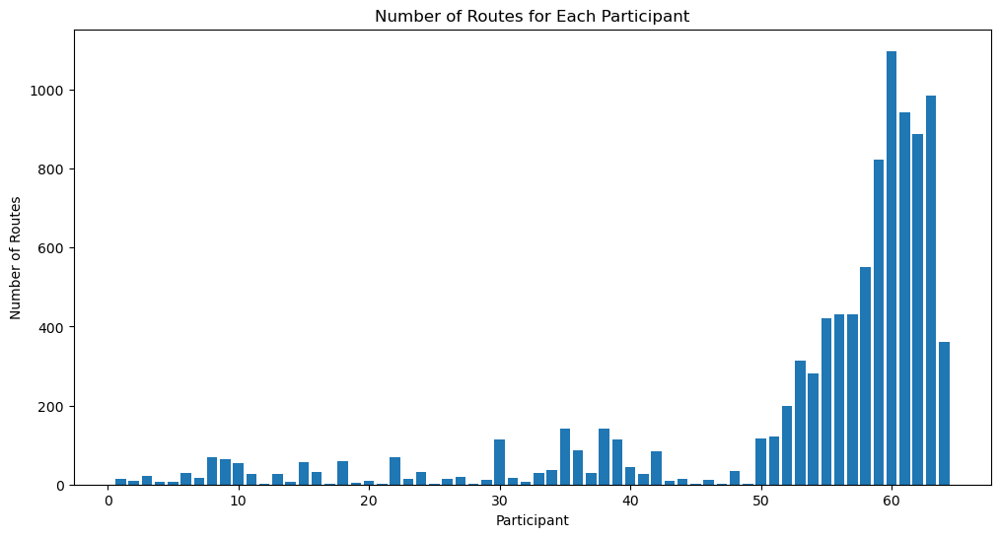

In [14]:
import matplotlib.pyplot as plt

# Create a dictionary to store the number of entries for each participant
participant_entries = {participant: len(dataframes) for participant, dataframes in LOADED_DATA.items()}

# Plot the number of entries for each participant
plt.figure(figsize=(12, 6))
plt.bar(participant_entries.keys(), participant_entries.values())
plt.xlabel('Participant')
plt.ylabel('Number of Routes')
plt.title('Number of Routes for Each Participant')
plt.show()

Counter({'walk': 4041, 'bus': 1868, 'bike': 1571, 'car': 787, 'subway': 621, 'taxi': 521, 'train': 180, 'run': 4, 'motorcycle': 2})


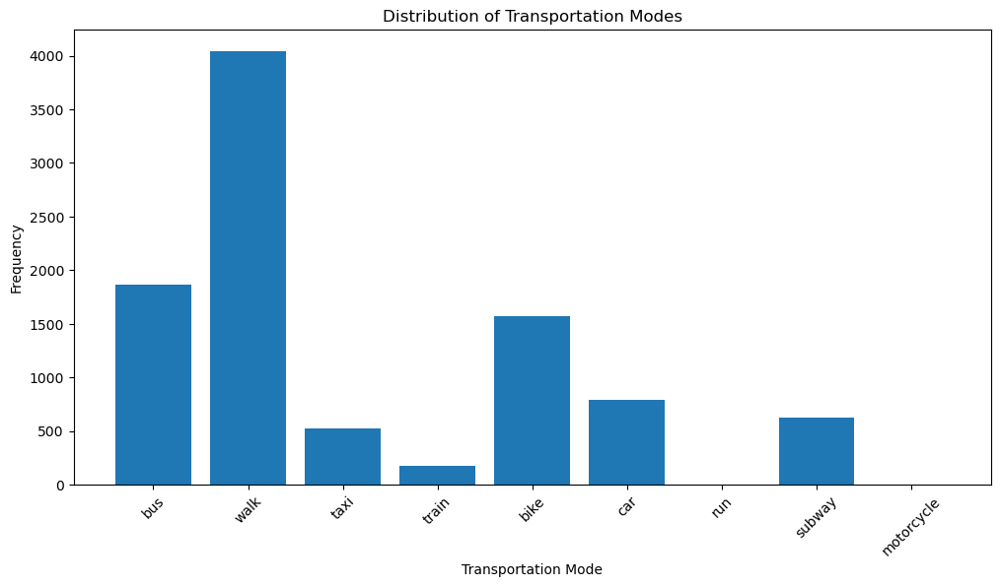

In [15]:
from collections import Counter

label_distribution = Counter()

for participant, dataframes in LOADED_DATA.items():
    for label in dataframes.keys():
        label_distribution[label.split('_')[1]] += 1

print(label_distribution)
plt.figure(figsize=(12, 6))
plt.bar(label_distribution.keys(), label_distribution.values())
plt.xlabel('Transportation Mode')
plt.ylabel('Frequency')
plt.title('Distribution of Transportation Modes')
plt.xticks(rotation=45)
plt.show()

# due to the low count of run and motorcycle data, i would remove them
#or retag them as walk and car

In [16]:
import pprint
print(type(LOADED_DATA[1]['0_bus']))
pprint.pprint(LOADED_DATA[1]['0_bus'])

<class 'pandas.core.frame.DataFrame'>
     latitude   longitude           date_time     timestamp
0   39.975133  116.329467 2007-06-27 09:49:22  1.182938e+09
1   39.975250  116.329067 2007-06-27 09:50:07  1.182938e+09
2   39.975267  116.329283 2007-06-27 09:50:11  1.182938e+09
3   39.975250  116.329417 2007-06-27 09:50:33  1.182938e+09
4   39.975283  116.330033 2007-06-27 09:51:58  1.182938e+09
..        ...         ...                 ...           ...
67  39.956733  116.359533 2007-06-27 10:16:42  1.182939e+09
68  39.956650  116.359917 2007-06-27 10:17:26  1.182939e+09
69  39.956650  116.360150 2007-06-27 10:17:38  1.182939e+09
70  39.956617  116.360317 2007-06-27 10:18:17  1.182939e+09
71  39.956650  116.361083 2007-06-27 10:19:19  1.182940e+09

[72 rows x 4 columns]
